In [254]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
import matplotlib.dates as md
import matplotlib.ticker as ticker
from scipy import stats
import numpy as np

In [255]:
Dots = pd.read_csv('Data_Level4_UMDOTS_CampusTrafficCount.csv')
Dots['Date'] = Dots['time'].str[:10]
Dots['Date'] = pd.to_datetime(Dots['Date'])
Dots['StartTime'] = Dots['time'].str[11:19]
Dots['StartTime'] = pd.to_datetime(Dots['StartTime'])
Dots['StartTime'] = Dots['StartTime'].apply(lambda x: x.time())
Dots['time'] = pd.to_datetime(Dots['time'].str[:10]+' '+Dots['time'].str[11:19])

In [256]:
def loca_into_five(a):
    if 'Gate' in a:
        return "Baltimore Avenue & Regents Drive (South Gate)"
    elif ('Campus' in a) & ('Paint' in a):
        return "Campus Drive & Paint Branch Drive"
    elif ('Regents' in a) & ('Stadium' in a):
        return "Stadium Drive & Regents Drive"
    else:
        return a

In [257]:
def temperature(a):
    if a.date()==datetime.date(2019,10,29):
        return 58.3
    elif a.date()==datetime.date(2019,10,30):
        return 57.1
    elif a.date()==datetime.date(2019,10,31):
        return 57.3
    elif a.date()==datetime.date(2019,11,1):
        return 43.9
    elif a.date()==datetime.date(2019,11,2):
        return 38.9
    elif a.date()==datetime.date(2019,11,3):
        return 40.0
    elif a.date()==datetime.date(2019,11,4):
        return 44.1
    elif a.date()==datetime.date(2019,11,5):
        return 45.9
    elif a.date()==datetime.date(2019,11,6):
        return 44.3
    elif a.date()==datetime.date(2019,11,7):
        return 49.7
    elif a.date()==datetime.date(2019,11,8):
        return 37.4
    elif a.date()==datetime.date(2019,11,9):
        return 32.6
    elif a.date()==datetime.date(2019,11,10):
        return 41.8
    elif a.date()==datetime.date(2019,11,11):
        return 50.2
    elif a.date()==datetime.date(2019,10,28):
        return 57.4


In [258]:
def calculate_center(a):
    return a[0]*a[1]+a[1]/2 if a[1]/2!=0.25 else a[0]*a[1]

In [259]:
def class_peaks(a):
    #print (a.values[1])
    if (a[1] in [1,3,5]) &(a[0] in np.arange(7.75,18.75,1.0)):
        return 1
    elif (a[1] in [2,4])& (a[0] in np.arange(7.75,19,1.5)):
        return 1
    else:
        return -1

In [260]:
def rounded_time(df):
    
    df_refined=df.copy()
    df_refined['dif']=df_refined['weekday'].apply(lambda x: 1 if x in [1,3,5] else (1.5 if x in [2,4] else 0.25))
    df_refined['idx']=df_refined[['hour','dif']].apply(lambda x:np.floor_divide(x[0], x[1]),axis=1)
    df_refined=df_refined.drop(columns=["hour"])
    df_output=df_refined.groupby(['Date','idx',"temp"],as_index=False).mean()
    df_output['center_time']=df_output[['idx','dif']].apply(calculate_center, axis=1)
    
    return df_output

In [261]:
Dots['location_5'] = Dots['location'].apply(loca_into_five)
Dots['weekday'] = Dots['Date'].apply(lambda x: x.weekday()+1)
import os
if not os.path.exists("figs"):
    os.makedirs("figs")

Dots_sensor_1=Dots[Dots['location_5']=='Campus Drive & Paint Branch Drive']
Dots_sensor_other=Dots[Dots['location_5']!='Campus Drive & Paint Branch Drive']
Dots_sensor_2=Dots[Dots['location_5']=='Stadium Drive & Regents Drive']
Dots_sensor_other=Dots_sensor_other[Dots_sensor_other['location_5']!='Stadium Drive & Regents Drive']
Dots_sensor_3=Dots[Dots['location_5']=='Baltimore Avenue & Regents Drive (South Gate)']
Dots_sensor_other=Dots_sensor_other[Dots_sensor_other['location_5']!='Baltimore Avenue & Regents Drive (South Gate)']

Dots_sensor_1=Dots_sensor_1.groupby(['time','location_5','Date','StartTime','weekday'],as_index=False).mean()
Dots_sensor_2=Dots_sensor_2.groupby(['time','location_5','Date','StartTime','weekday'],as_index=False).mean()
Dots_sensor_3=Dots_sensor_3.groupby(['time','location_5','Date','StartTime','weekday'],as_index=False).mean()
Dots_sensor_other=Dots_sensor_other.drop(columns=['location'])

for i in ['pedestrians','bicyclists','cars','buses','trucks']:
    Dots_sensor_2[i]=Dots_sensor_2[i]*2

Dots_mod=Dots_sensor_1.append([Dots_sensor_2,Dots_sensor_3,Dots_sensor_other],ignore_index=False)

D:\Users\mrzcl\Anaconda3\envs\homework1\lib\site-packages\pandas\core\frame.py:6201: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  sort=sort)


## Generate Train-test data

In [262]:
from sklearn.model_selection import train_test_split

def generate_train_test_idx(df_input,locs,types,ratio):
    Dots_list=[]
    train_idx_list=[]
    test_idx_list=[]
    for i in locs:
        Dots_list.append(df_input[df_input["location_5"]==i])
    
    for i in range(len(locs)):
        df=Dots_list[i]
        idx=range(df.shape[0])
        train_idx,test_idx=train_test_split(idx,test_size=ratio,random_state=0)
        train_idx_list.append(train_idx)
        test_idx_list.append(test_idx)
    return Dots_list,train_idx_list,test_idx_list
    



In [279]:
#This model would eleminate the game day
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn import svm

def model_1_for_no_gamedays(df,train_idx,test_idx):
    train_1=df.iloc[train_idx,:]
    train_1=train_1[train_1["is_gameday"]==-1] ##Eliminate the gameday
    train_1_rounded=rounded_time(train_1)
    train_x=train_1_rounded[["center_time","weekday",'temp']]
    train_y=train_1_rounded[['pedestrians','bicyclists','cars','buses','trucks']]
    #cols_to_norm = ['pedestrians','bicyclists','cars','buses','trucks']
    #train_y_norm=train_y[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
    regr1=RandomForestRegressor()
    regr1.fit(train_x, train_y)
    test_1=df.iloc[test_idx,:]
    test_1=test_1[test_1["is_gameday"]==-1]
    test_1_x=test_1[["hour","weekday",'temp']]
    test_1_y=regr1.predict(test_1_x)
    train_temp_x=train_1[["hour","weekday",'temp']]
    train_temp_y_1=train_1[['pedestrians','bicyclists','cars','buses','trucks']]
    
    train_temp_y_2=np.nan_to_num(regr1.predict(train_temp_x[["hour","weekday",'temp']]))+0.001
    train_temp_y_3=train_temp_y_1-train_temp_y_2
    regr2=DecisionTreeRegressor()
    train_temp_x_2=train_1[["hour",'to_class_peak','num_peaks']]
    regr2.fit(train_temp_x_2, train_temp_y_3)
    test_2_x=test_1[["hour",'to_class_peak','num_peaks']]
    
    test_2_y=regr2.predict(test_2_x)
    test_y=test_2_y+test_1_y
    test_y[test_y < 0] = 0
    
    return test_y
    
        #true_y=test_1[['pedestrians','bicyclists','cars','buses','trucks']]
        #true_y_norm=true_y[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
    

In [280]:
def to_class_peaks(a):
    ##Please enter the class schedule
    class_schedule={1:np.arange(7.75,18.75,1.0),
                   2:np.arange(7.75,19,1.5),
                   3:np.arange(7.75,18.75,1.0),
                   4:np.arange(7.75,19,1.5),
                   5:np.arange(7.75,18.75,1.0)}
    if a[1] in class_schedule:
        dif_min=np.amin(a[0]-class_schedule[a[1]])
        return dif_min
        
    return -1
    

In [281]:
def calculated_peak_number(a):
    class_schedule={1:np.arange(7.75,18.75,1.0),
                   2:np.arange(7.75,19,1.5),
                   3:np.arange(7.75,18.75,1.0),
                   4:np.arange(7.75,19,1.5),
                   5:np.arange(7.75,18.75,1.0)}
    
    if a in class_schedule:
        return class_schedule[a].size
        
    else:
        return 0

In [282]:
from sklearn import svm
def model_3_for_gameday(df,train_idx,test_idx):
    train_3=df.iloc[train_idx,:]
    train_3=train_3[train_3["is_gameday"]==1]
    test_3=df.iloc[test_idx,:]
    test_3=test_3[test_3["is_gameday"]==1]
    if test_3.shape[0]!=0:
        train_3_x=train_3[['to_FB_start','to_FB_end']]
        train_3_y=train_3[['pedestrians','bicyclists','cars','buses','trucks']]
        test_3_x=test_3[['to_FB_start','to_FB_end']]
        test_3_y=test_3[['pedestrians','bicyclists','cars','buses','trucks']]
        regr3=svm.SVR()
        regr3.fit(train_3_x, train_3_y)
        test_3_y=regr3.predict(test_3_x)
        test_3_y[test_3_y < 0] = 0
        return test_3_y

## General Testing

R2=0.8079046379521311


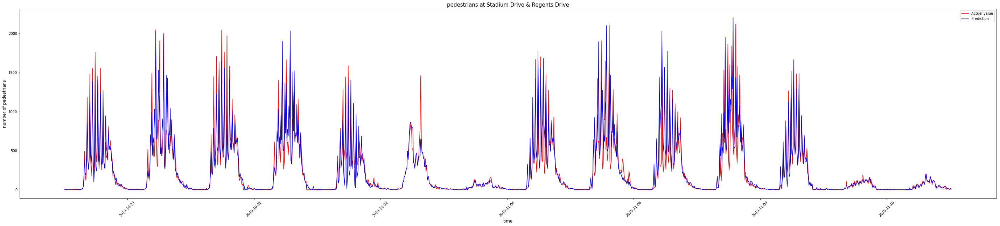

R2=0.8590357868320898


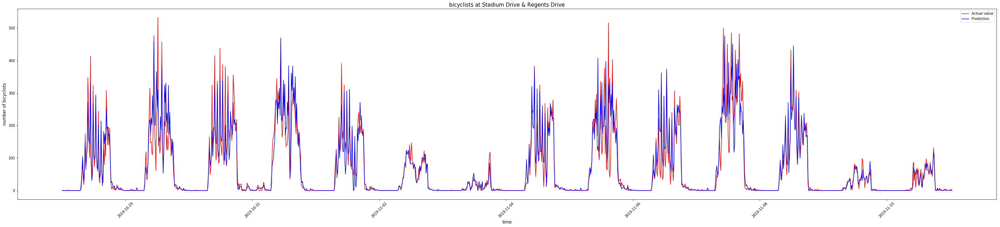

R2=0.9429134719124521


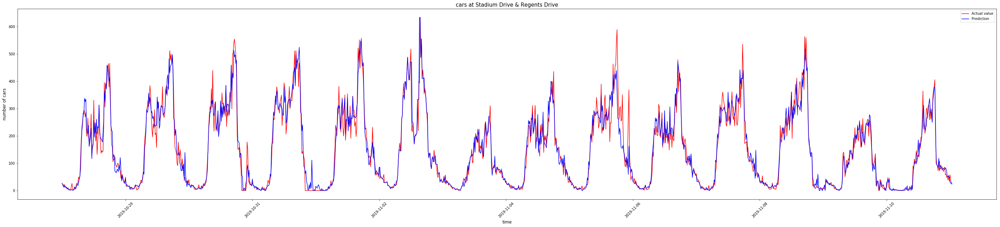

R2=0.8894293366620791


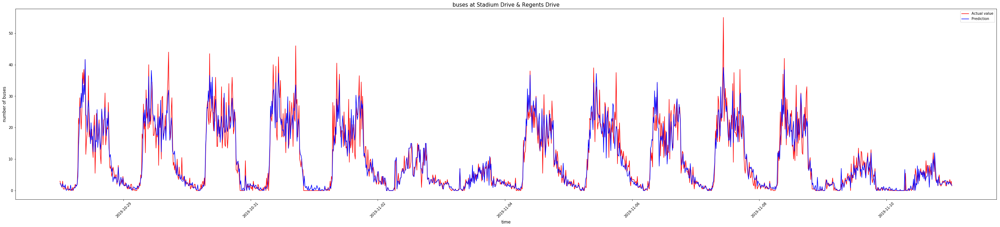

R2=0.9052230092456908


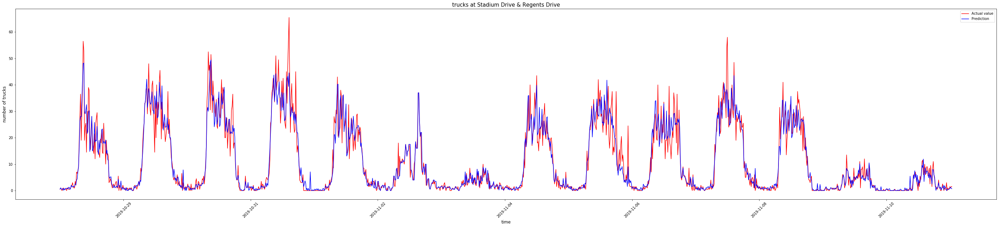

R2=0.8757345450621625


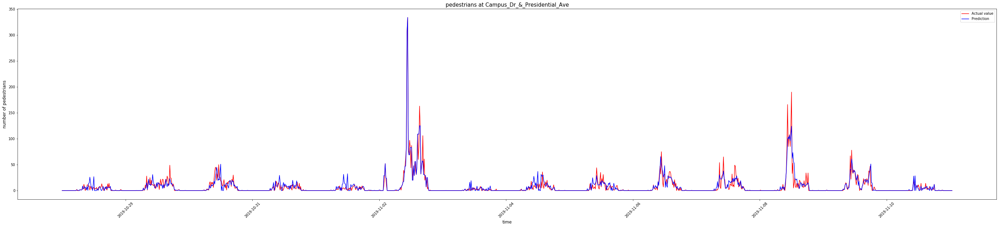

R2=0.5734149373272184


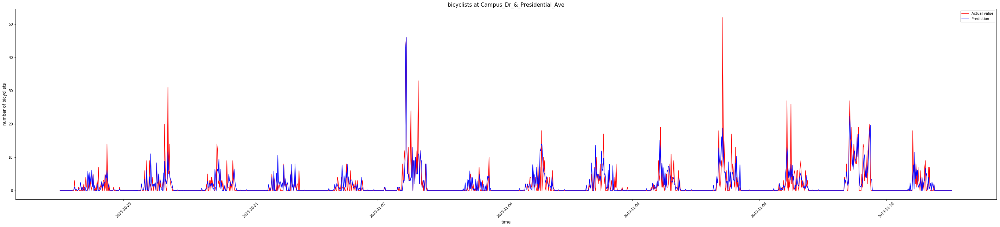

R2=0.9179431160604088


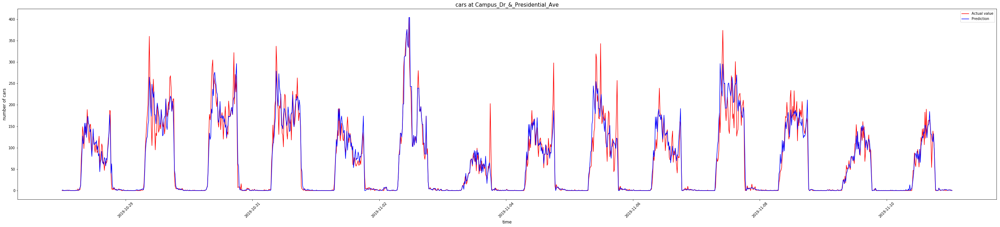

R2=0.7179060452298313


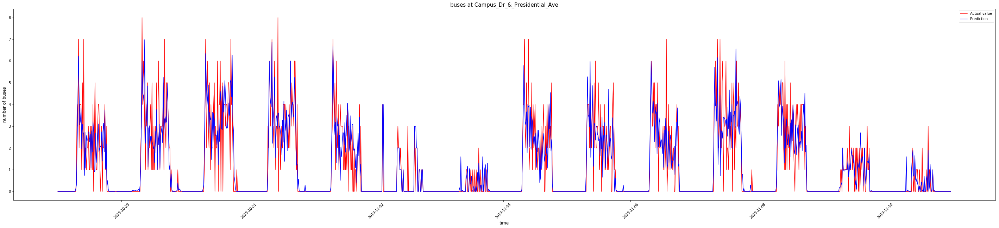

R2=0.7544706922191141


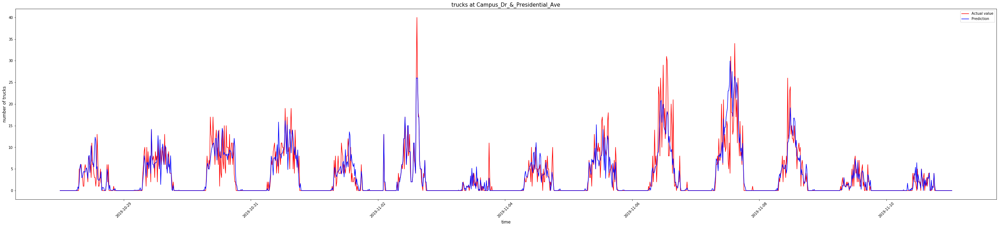

R2=0.6383418819408364


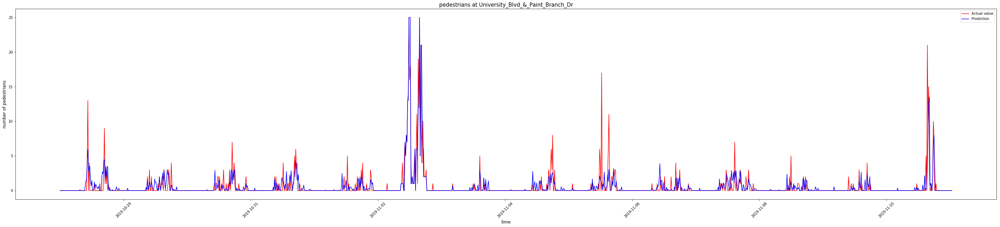

R2=0.7061454882877598


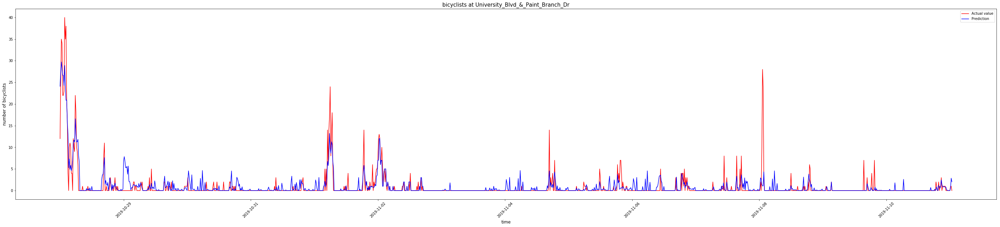

R2=0.9310428145355892


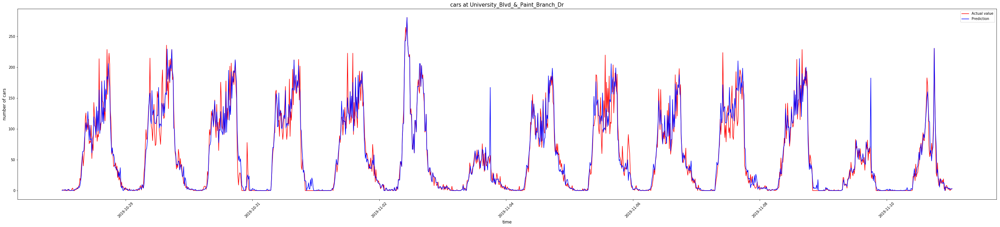

R2=0.5463209677249055


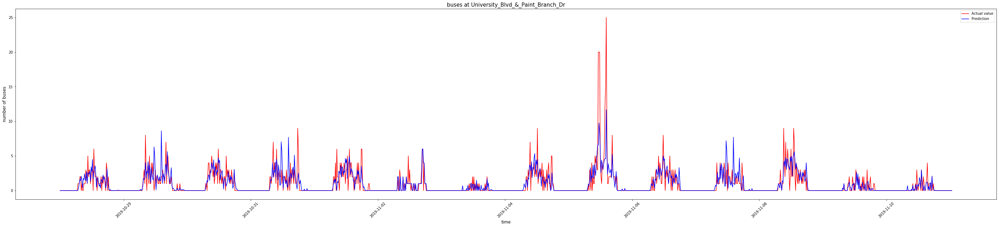

R2=0.8420689564896038


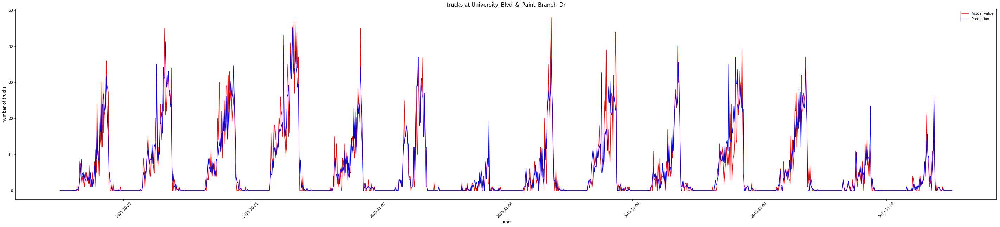

R2=0.843944944435861


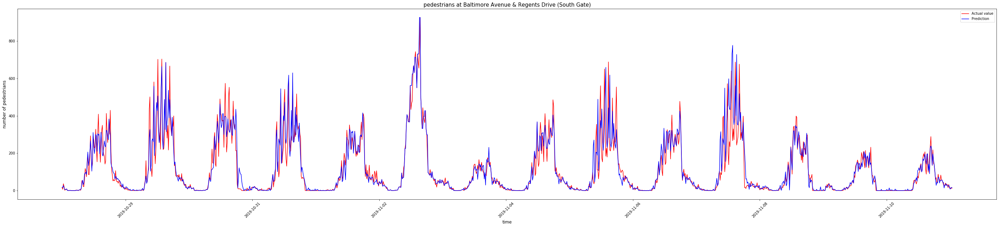

R2=0.761359382997461


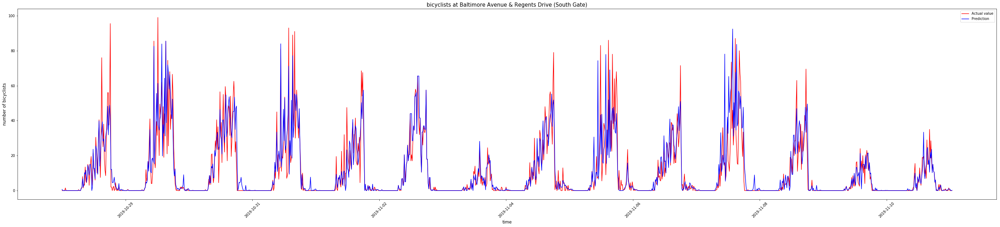

R2=0.9603364339151568


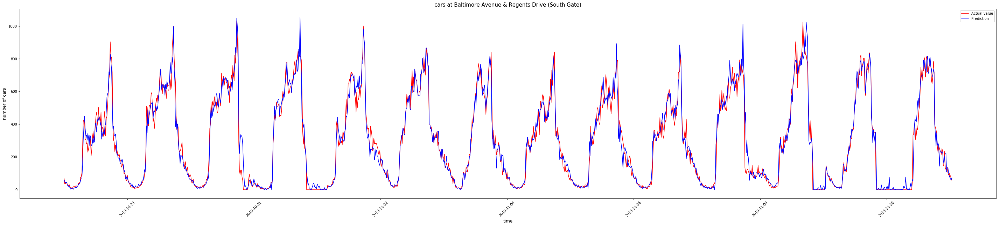

R2=0.7755509611695464


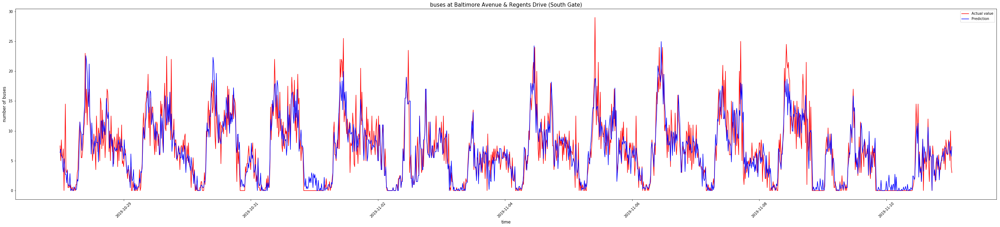

R2=0.821808100133109


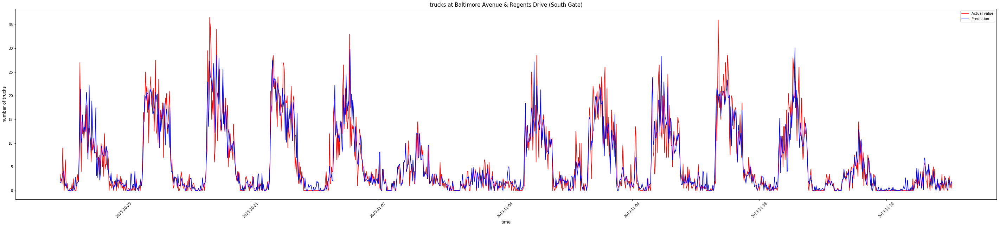

R2=0.682369989505716


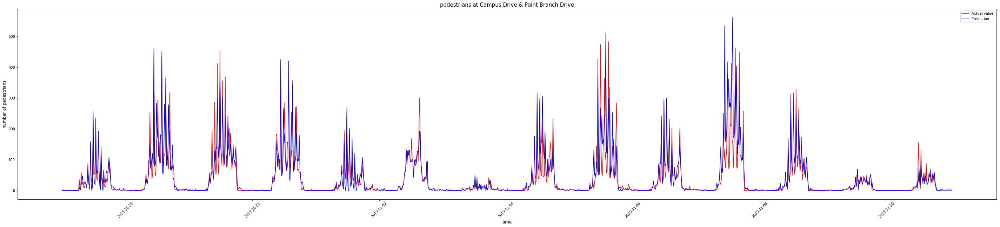

R2=0.5700371944076783


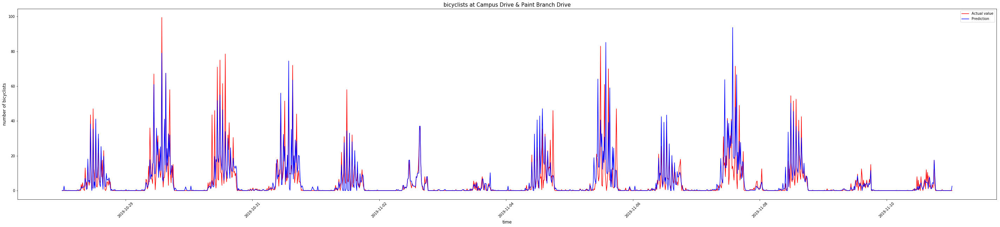

R2=0.9303598992097573


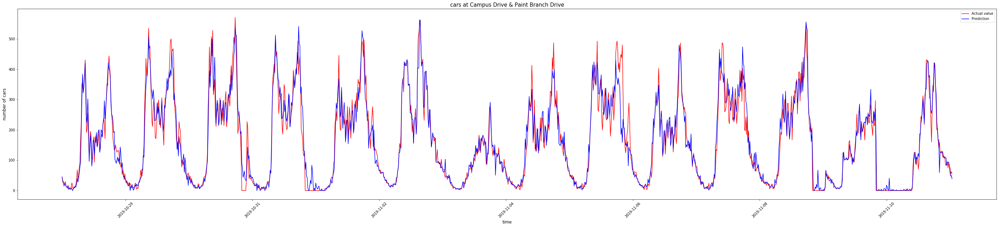

R2=0.902966774634001


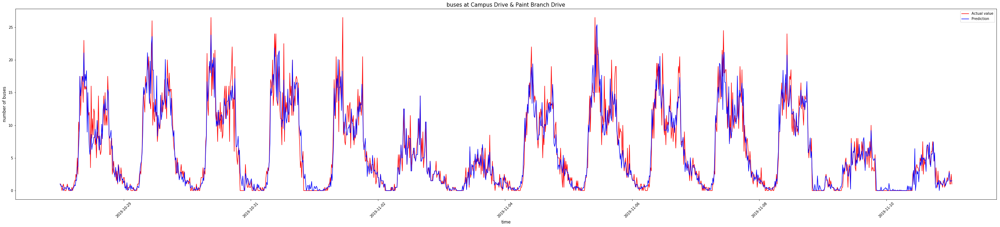

R2=0.8734295484200496


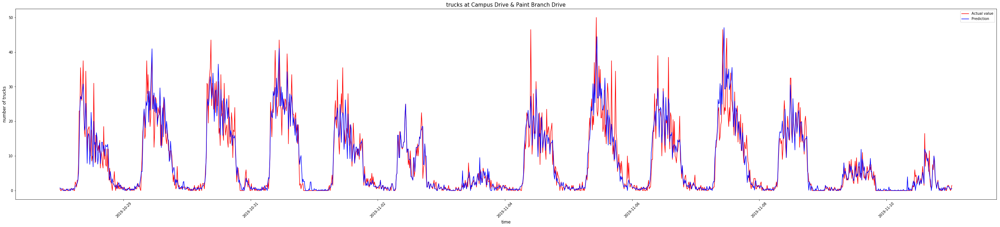

In [283]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor

#Data Preprocessing
Dots_mod['FB_start']=Dots_mod['Date'].apply(lambda x: 12 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['FB_end']=Dots_mod['Date'].apply(lambda x: 15 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['hour']=Dots_mod['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_mod['temp']=Dots_mod['Date'].apply(lambda x: temperature(x))
Dots_mod['is_weekend']=Dots_mod['weekday'].apply(lambda x: 1 if x==6 or x==7 else -1)
Dots_mod['is_gameday']=Dots_mod['Date'].apply(lambda x: 1 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['to_FB_start']=Dots_mod[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_FB_end']=Dots_mod[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_class_peak']=Dots_mod[['hour','weekday']].apply(to_class_peaks,axis=1)
Dots_mod['num_peaks']=Dots_mod['weekday'].apply(calculated_peak_number)

#Dots_mod['BK_start']=Dots_mod['Date'].apply(lambda x: 19.5 if x.date()==datetime.date(2019,11,1) or x.date()==datetime.date(2019,11,5) else (21 if x.date()==datetime.date(2019,11,9) else -1))
#Dots_mod['BK_end']=Dots_mod['Date'].apply(lambda x: 22.5 if x.date()==datetime.date(2019,11,1) or x.date()==datetime.date(2019,11,5) else (24 if x.date()==datetime.date(2019,11,9) else -1))

Dots_input=Dots_mod.copy()

locs=['Stadium Drive & Regents Drive','Campus_Dr_&_Presidential_Ave','University_Blvd_&_Paint_Branch_Dr',
                 'Baltimore Avenue & Regents Drive (South Gate)','Campus Drive & Paint Branch Drive']
types=['pedestrians','bicyclists','cars','buses','trucks']
ratio=0.30
Dots_list,train_idx_list,test_idx_list=generate_train_test_idx(Dots_input,locs,types,ratio)


#analysis about the time


for i in range(len(locs)):
    df=Dots_list[i]
    idx=range(df.shape[0])
    #test_idx=test_idx_list[i]
    test_idx=idx
    train_idx=train_idx_list[i]
    
    test_y_1_int=model_1_for_no_gamedays(df,train_idx,test_idx)
    test_y_1=pd.DataFrame(data=test_y_1_int, columns=['pedestrians','bicyclists','cars','buses','trucks'])
    test_1=df.iloc[test_idx,:]
    test_1=test_1[test_1["is_gameday"]==-1]
    test_y_1['time']=test_1.time.values
    
    
    test_y_2_in=model_2_for_gameday(df,train_idx,test_idx)
    test_2=df.iloc[test_idx,:]
    test_2=test_2[test_2["is_gameday"]==1]
    test_y_2=pd.DataFrame(data=test_y_2_in, columns=['pedestrians','bicyclists','cars','buses','trucks'])
    test_y_2['time']=test_2.time.values
    
    test_y=test_y_1.append(test_y_2)
    test_y=test_y.sort_values(by='time',ascending=True)
    
    
    
    true_y=df.iloc[test_idx,:][['pedestrians','bicyclists','cars','buses','trucks']]
    x=df.iloc[test_idx,:].time
    
    
    
    
    for j in range(len(types)):
        acc=r2_score(true_y[types[j]], test_y.iloc[:,j])
        print ("R2="+ str(acc))
        fig = plt.figure(figsize=(50,10))
        ax = plt.subplot(111)
        ax.plot(x, true_y[types[j]], label='Actual value',color='r')
        ax.plot(x, test_y.iloc[:,j], label='Prediction',color='b')
        ax.legend()
        plt.xlabel('time', fontsize =12)
        plt.xticks(rotation=45)
        plt.ylabel('number of '+ types[j],fontsize =12)
        plt.title(types[j] + ' at '+locs[i], color = "k",fontsize =15)
        plt.show()
    
    




## Experiment 1: Change gameday schedule

In [268]:
def generate_train_test_idx_based_date(df_input,locs,types,testdate):
    Dots_list=[]
    train_idx_list=[]
    test_idx_list=[]
    for i in locs:
        Dots_list.append(df_input[df_input["location_5"]==i])
    
    for i in range(len(locs)):
        df=Dots_list[i]
        df.reset_index(drop=True, inplace=True)
        test_idx=df[df['Date']==testdate].index.values
        train_idx=df[df['Date']!=testdate].index.values
        
        train_idx_list.append(train_idx)
        test_idx_list.append(test_idx)
    return Dots_list,train_idx_list,test_idx_list

R2=-0.023093309259694994


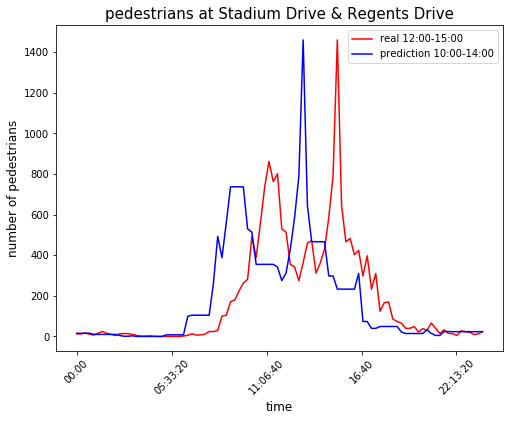

R2=0.17274763063742393


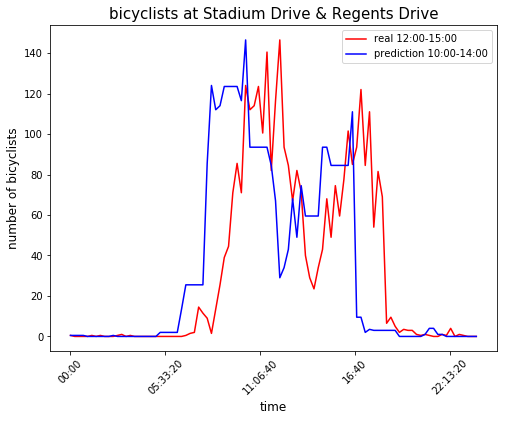

R2=0.19830408959202173


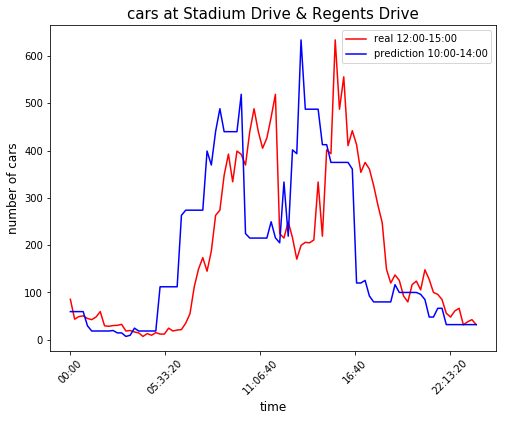

R2=0.07107543441576036


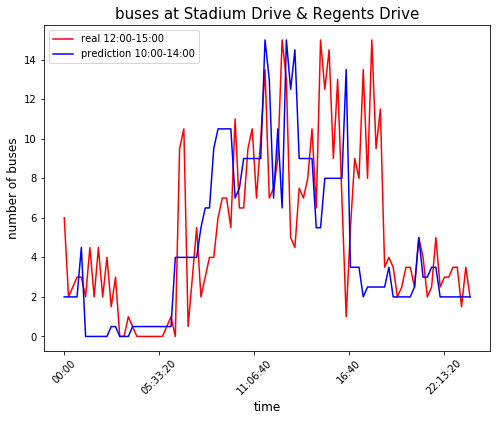

R2=-0.263673955191982


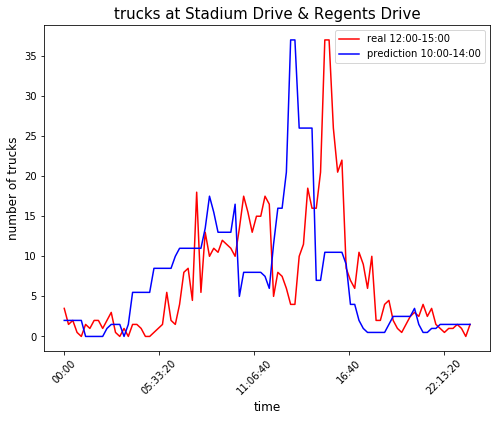

R2=-0.39659972552362177


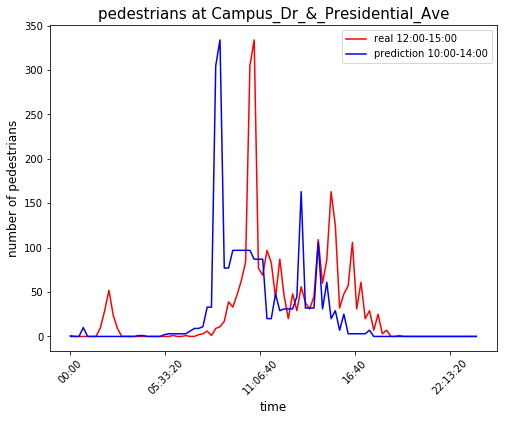

R2=-0.5844403654852506


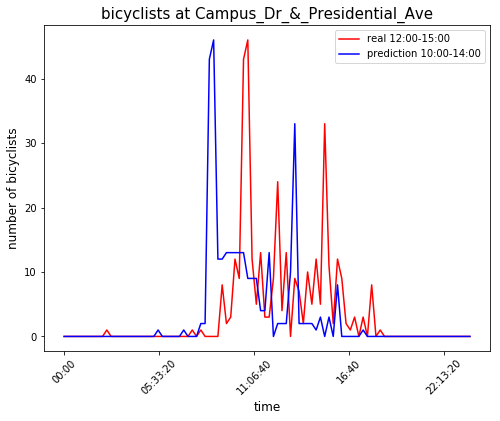

R2=0.4542027079491764


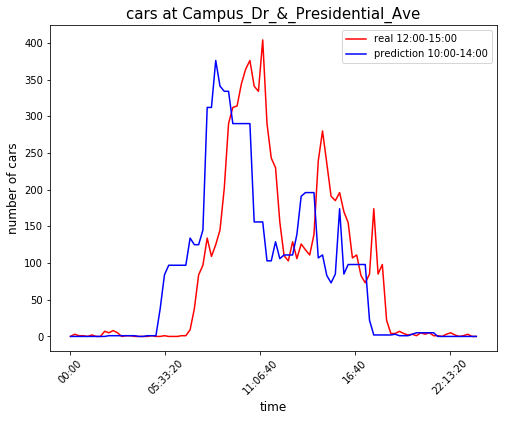

R2=-0.19772583701831947


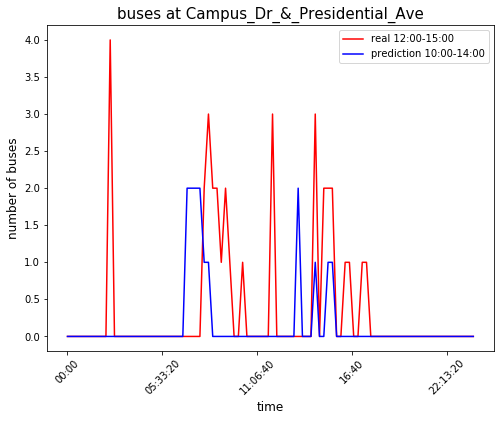

R2=-0.00048553790663796725


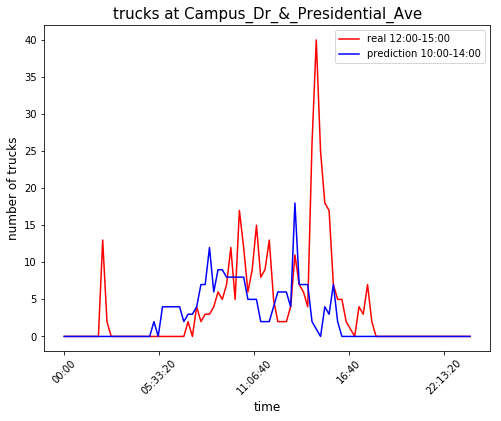

R2=-0.5421126395016871


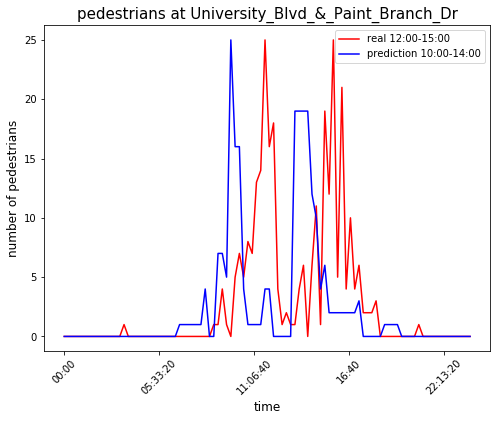

R2=0.15050481333646404


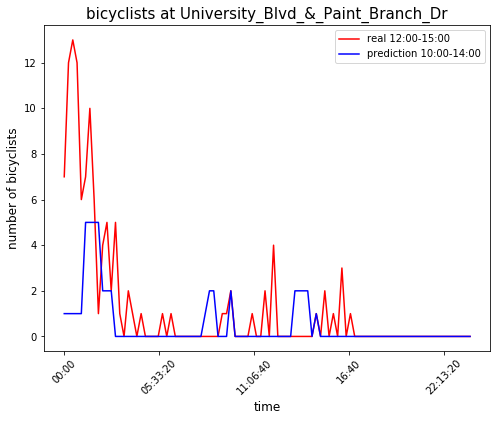

R2=0.3021507388325886


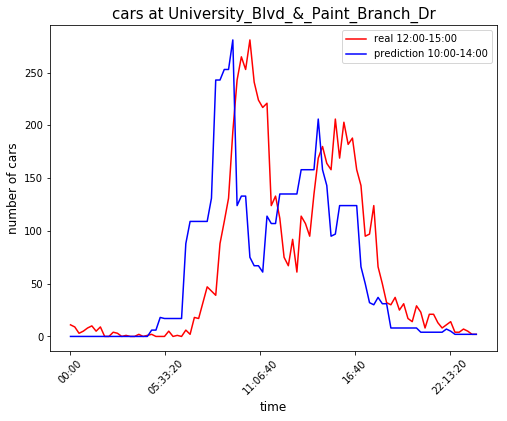

R2=-0.6861909311383849


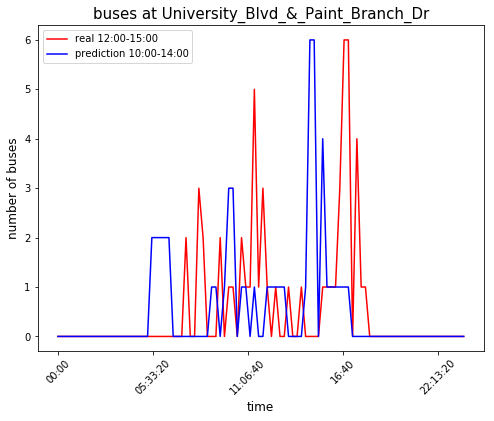

R2=0.05121133724059346


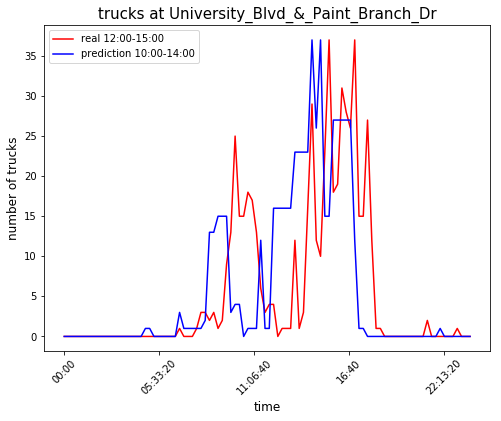

R2=0.5425851601600198


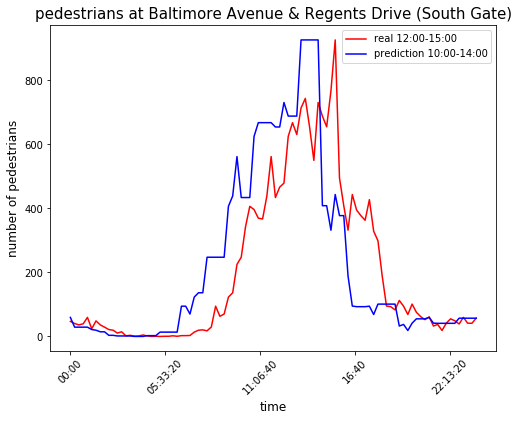

R2=0.15576964548067362


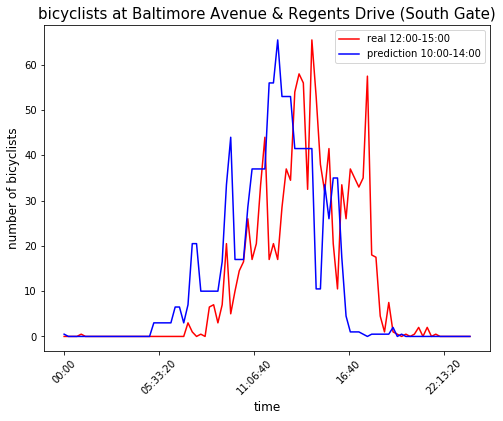

R2=0.5493047040518415


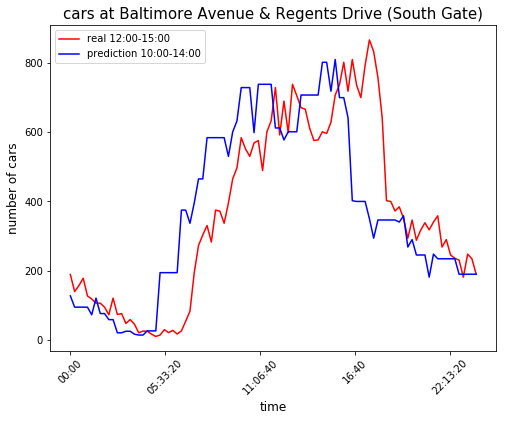

R2=-0.5484538839453243


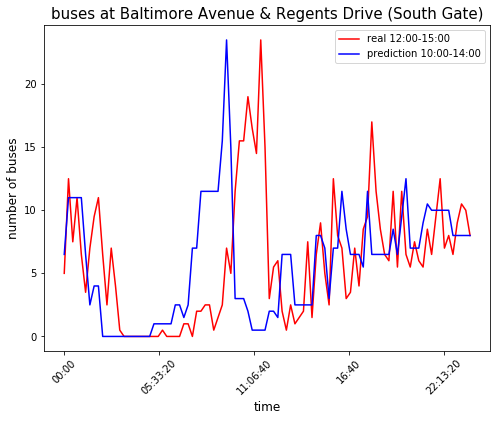

R2=-0.15922373034843673


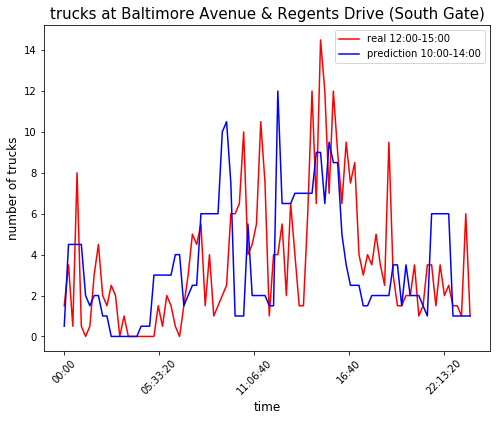

R2=0.13202323477365452


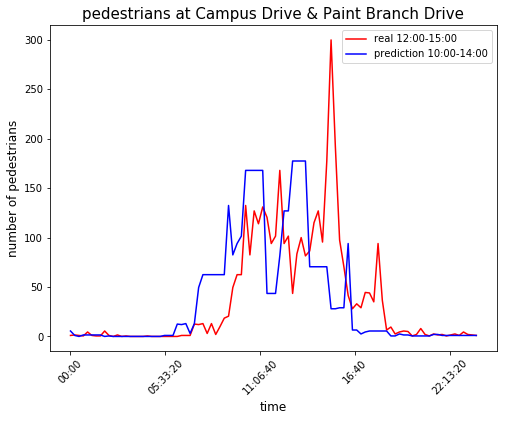

R2=-0.37616568453572885


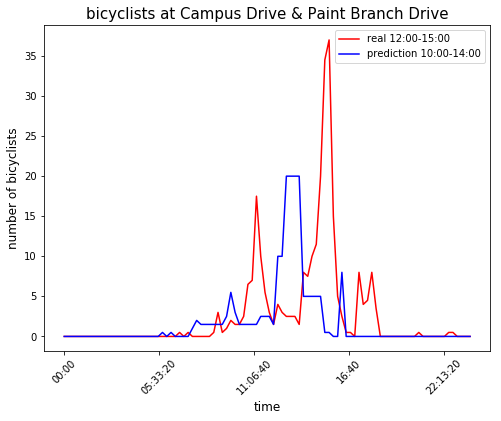

R2=0.3274402992968005


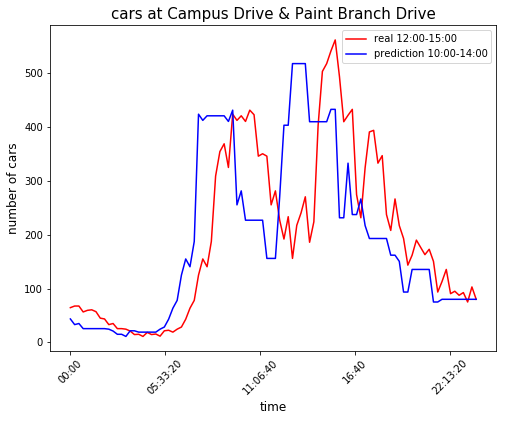

R2=-0.1461769914726403


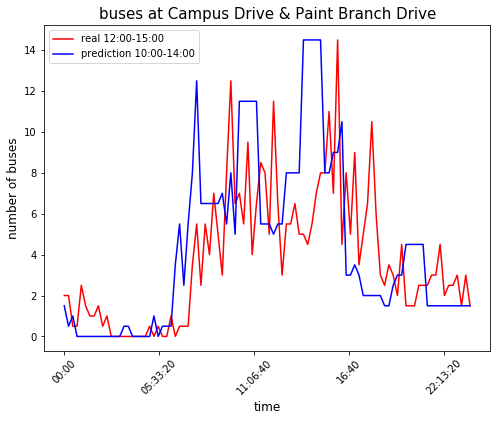

R2=0.03764067986514741


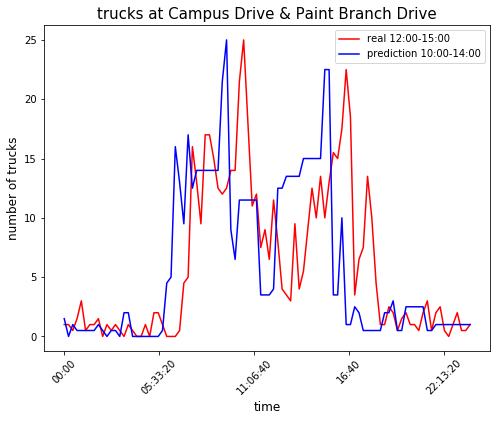

In [269]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor

#Data Preprocessing
Dots_test=Dots_mod[Dots_mod['Date']=='2019-11-02'].copy()
Dots_mod['FB_start']=Dots_mod['Date'].apply(lambda x: 12 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['FB_end']=Dots_mod['Date'].apply(lambda x: 15 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['hour']=Dots_mod['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_mod['temp']=Dots_mod['Date'].apply(lambda x: temperature(x))
Dots_mod['is_weekend']=Dots_mod['weekday'].apply(lambda x: 1 if x==6 or x==7 else -1)
Dots_mod['is_gameday']=Dots_mod['Date'].apply(lambda x: 1 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['to_FB_start']=Dots_mod[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_FB_end']=Dots_mod[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_class_peak']=Dots_mod[['hour','weekday']].apply(to_class_peaks,axis=1)
Dots_mod['num_peaks']=Dots_mod['weekday'].apply(calculated_peak_number)

## You can revise game time here
Dots_test['Date']='2019-11-16'
Dots_test['FB_start']=10
Dots_test['FB_end']=14
Dots_test['hour']=Dots_test['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_test['temp']=38.9
Dots_test['is_weekend']=1
Dots_test['is_gameday']=1
Dots_test['to_FB_start']=Dots_test[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_test['to_FB_end']=Dots_test[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_test['to_class_peak']=Dots_test[['hour','weekday']].apply(to_class_peaks,axis=1)
Dots_test['num_peaks']=Dots_test['weekday'].apply(calculated_peak_number)

Dots_input=Dots_mod.append(Dots_test,ignore_index=True)



locs=['Stadium Drive & Regents Drive','Campus_Dr_&_Presidential_Ave','University_Blvd_&_Paint_Branch_Dr',
                 'Baltimore Avenue & Regents Drive (South Gate)','Campus Drive & Paint Branch Drive']
types=['pedestrians','bicyclists','cars','buses','trucks']

Dots_list, train_idx_list,test_idx_list=generate_train_test_idx_based_date(Dots_input,locs,types,'2019-11-16')

#analysis about the time
for i in range(len(locs)):
    df=Dots_list[i]
    idx=range(df.shape[0])
    test_idx=test_idx_list[i]
    #test_idx=idx
    train_idx=train_idx_list[i]
    
    test_1=df.iloc[test_idx,:]
    test_1=test_1[test_1["is_gameday"]==-1]
    if test_1.shape[0]!=0:
        test_y_1_int=model_1_for_no_gamedays(df,train_idx,test_idx)
        test_y_1=pd.DataFrame(data=test_y_1_int, columns=['pedestrians','bicyclists','cars','buses','trucks'])
        test_y_1['time']=test_1.time.values
    
    test_2=df.iloc[test_idx,:]
    test_2=test_2[test_2["is_gameday"]==1]
    if test_2.shape[0]!=0:
        test_y_2_in=model_2_for_gameday(df,train_idx,test_idx)
        test_y_2=pd.DataFrame(data=test_y_2_in, columns=['pedestrians','bicyclists','cars','buses','trucks'])
        test_y_2['time']=test_2.time.values
    
    if test_2.shape[0]==0:
        test_y=test_y_1
    elif test_1.shape[0]==0:
        test_y=test_y_2
    else:
        test_y=test_y_1.append(test_y_2)
        
    test_y=test_y.sort_values(by='time',ascending=True)
    
    
    
    true_y=df.iloc[test_idx,:][['pedestrians','bicyclists','cars','buses','trucks']]
    x=df.iloc[test_idx,:].StartTime
    
    
    
    
    for j in range(len(types)):
        acc=r2_score(true_y[types[j]], test_y.iloc[:,j])
        print ("R2="+ str(acc))
        fig = plt.figure(figsize=(8,6))
        ax = plt.subplot(111)
        ax.plot(x, true_y[types[j]], label='real 12:00-15:00',color='r')
        ax.plot(x, test_y.iloc[:,j], label='prediction 10:00-14:00',color='b')
        ax.legend()
        plt.xlabel('time', fontsize =12)
        plt.xticks(rotation=45)
        plt.ylabel('number of '+ types[j],fontsize =12)
        plt.title(types[j] + ' at '+locs[i], color = "k",fontsize =15)
        plt.show()
    
    




## Experiment 2: Change class schedule

In [270]:
def to_class_peaks_2(a):
    ##Please enter the class schedule
    class_schedule={1:np.arange(7.75,18.75,0.75),
                   2:np.arange(7.75,19,1.5),
                   3:np.arange(7.75,18.75,1.0),
                   4:np.arange(7.75,19,1.5),
                   5:np.arange(7.75,18.75,1.0)}
    if a[1] in class_schedule:
        dif_min=np.amin(a[0]-class_schedule[a[1]])
        return dif_min
        
    return -1
    

In [271]:
def calculated_peak_number_2(a):
    class_schedule={1:np.arange(7.75,18.75,0.5),
                   2:np.arange(7.75,19,1.5),
                   3:np.arange(7.75,18.75,1.0),
                   4:np.arange(7.75,19,1.5),
                   5:np.arange(7.75,18.75,1.0)}
    
    if a in class_schedule:
        return class_schedule[a].size
        
    else:
        return 0

D:\Users\mrzcl\Anaconda3\envs\homework1\lib\site-packages\ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
D:\Users\mrzcl\Anaconda3\envs\homework1\lib\site-packages\ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


R2=0.7387881697538075


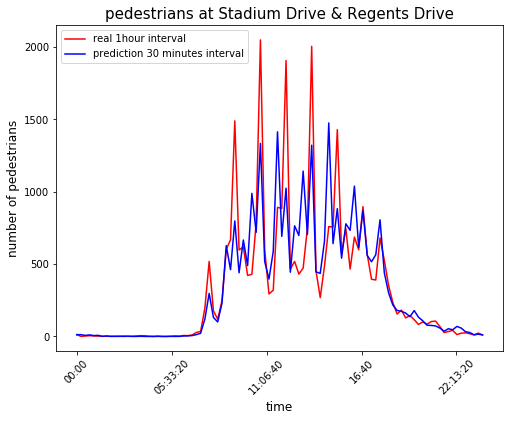

R2=0.6932090093649412


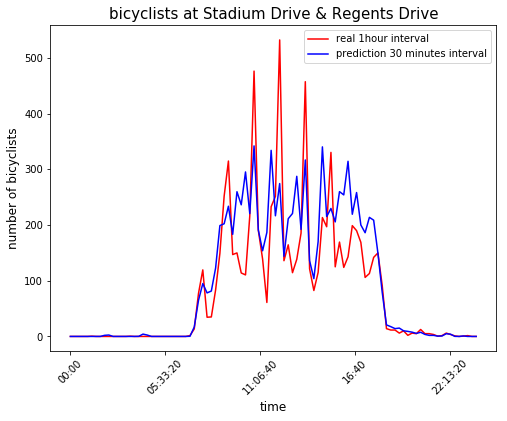

R2=0.9336352814299911


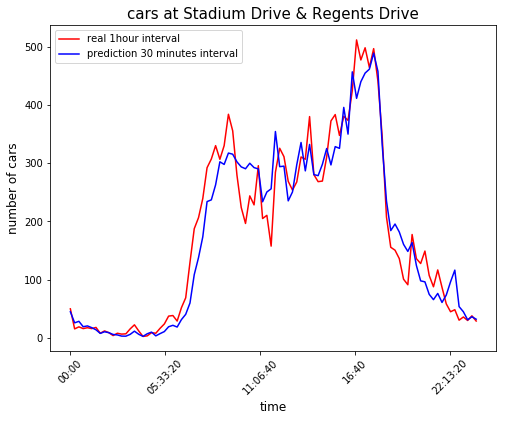

R2=0.8639784222094418


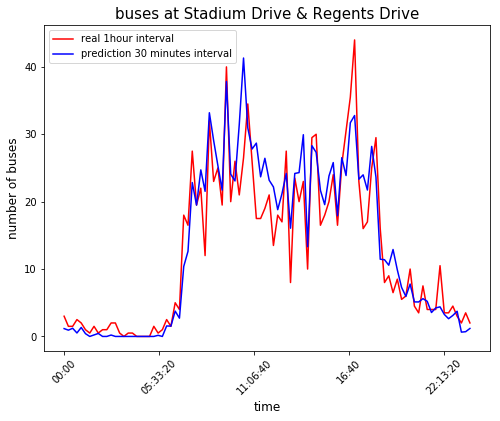

R2=0.885012623317633


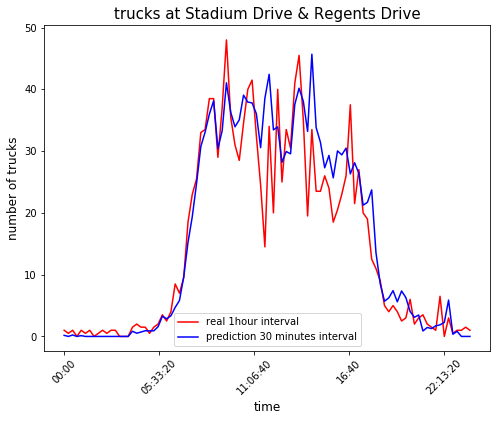

R2=0.5728142055038646


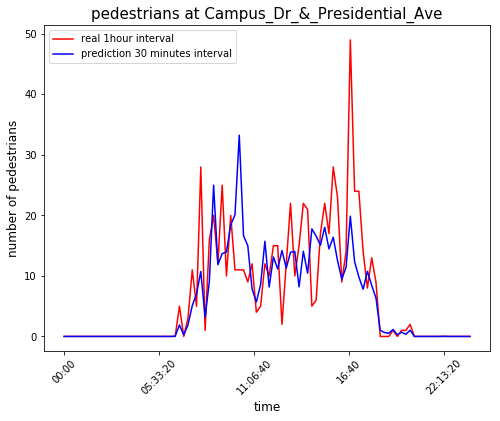

R2=0.43460469615422437


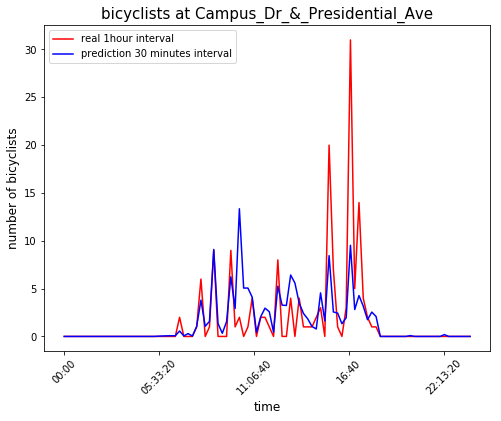

R2=0.8772156738038177


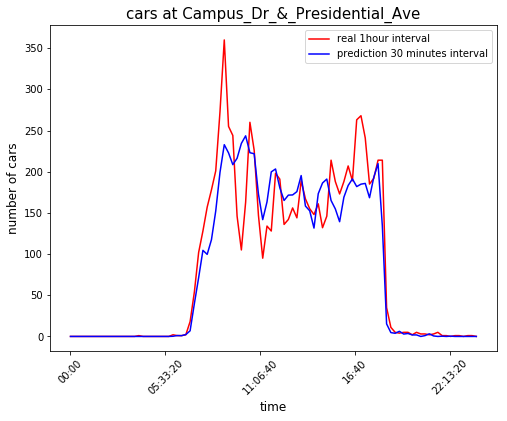

R2=0.8121727180091449


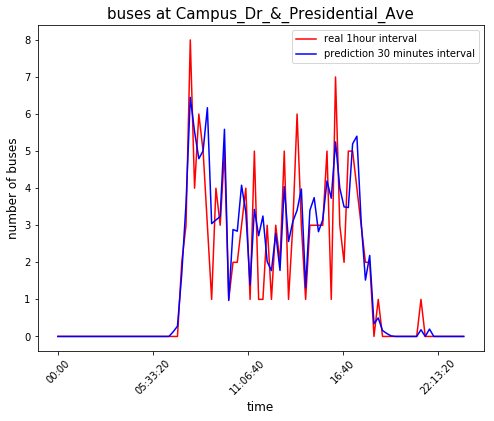

R2=0.46867211076901083


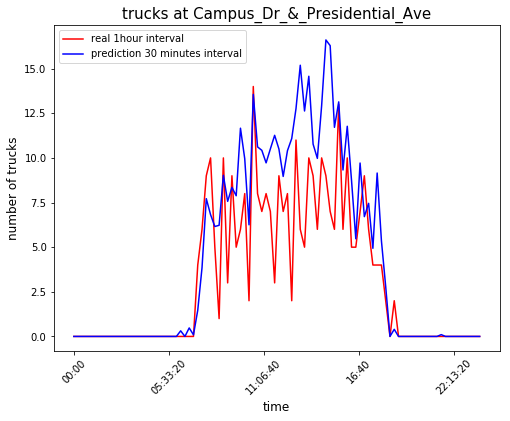

R2=0.06650146707459847


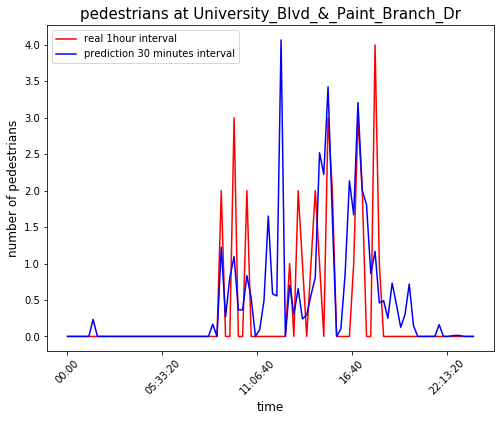

R2=0.03120977402024916


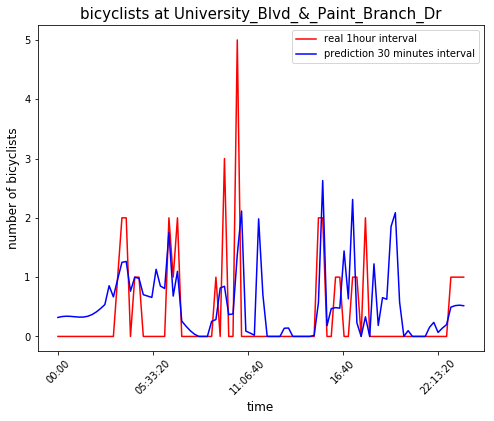

R2=0.8931815106453258


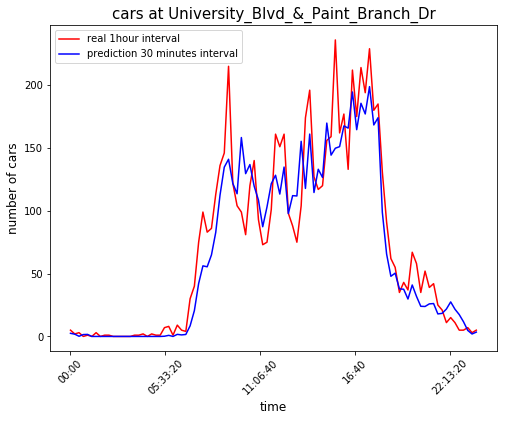

R2=0.1799030844255889


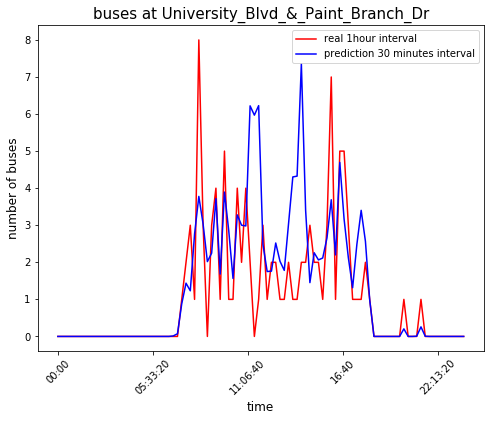

R2=0.8746585888124856


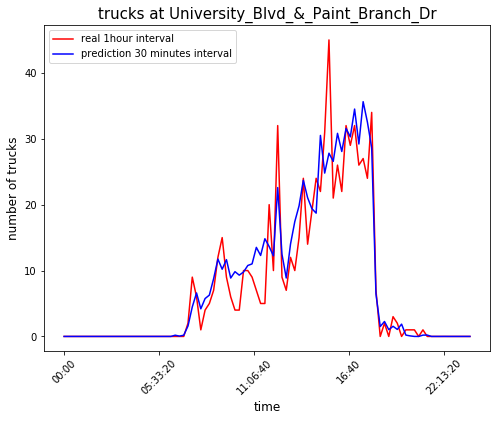

R2=0.7649404351073341


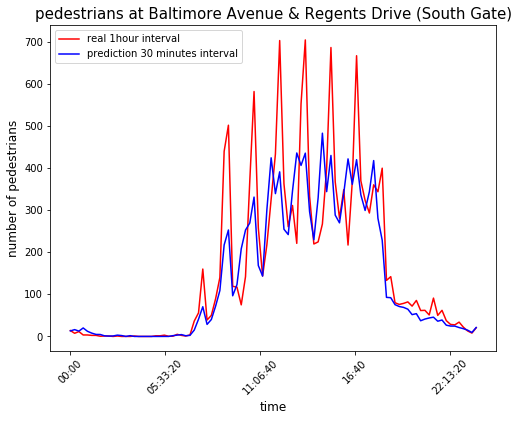

R2=0.8258742658807675


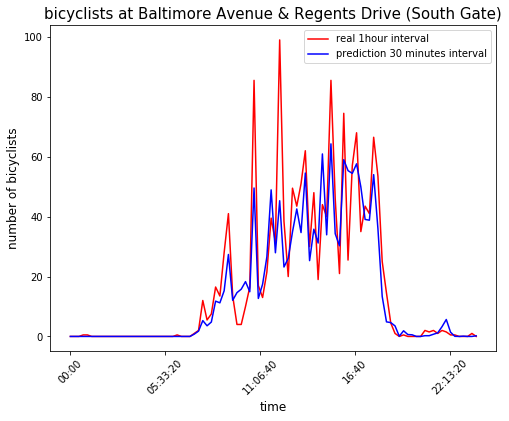

R2=0.9459584355572525


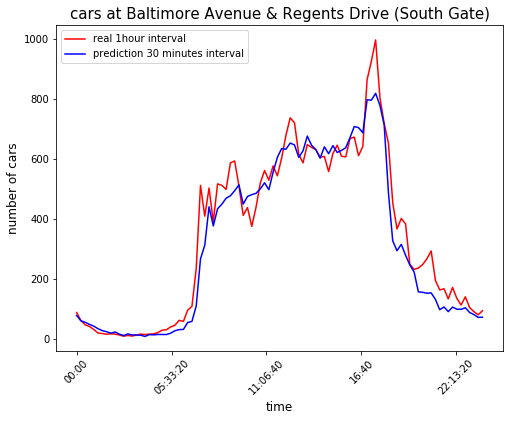

R2=0.7400604641481272


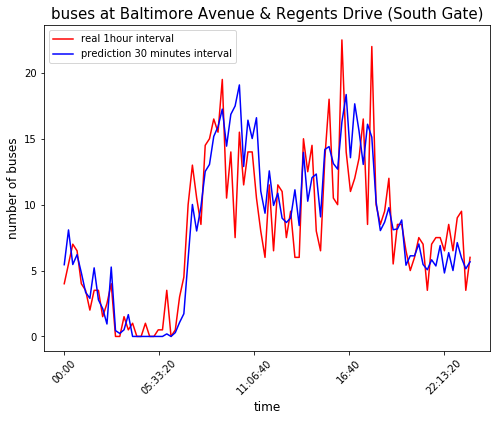

R2=0.8524556228984717


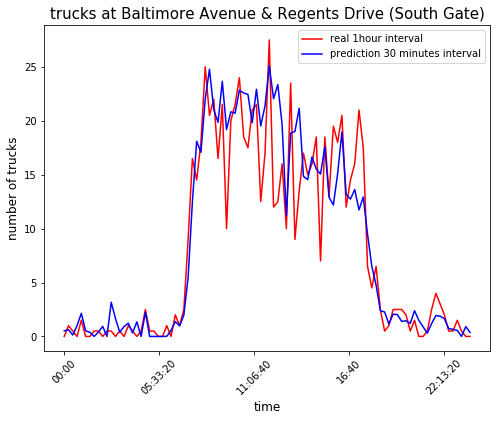

R2=0.6891393136767512


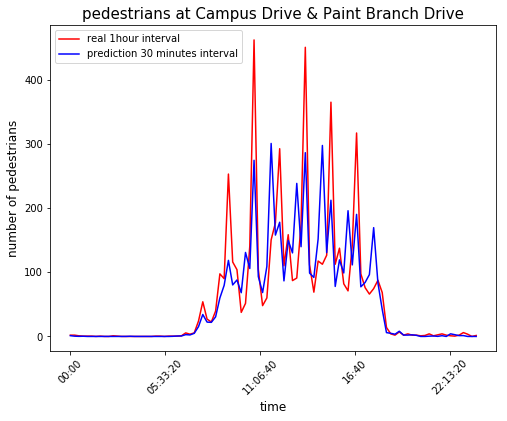

R2=0.5986846696783462


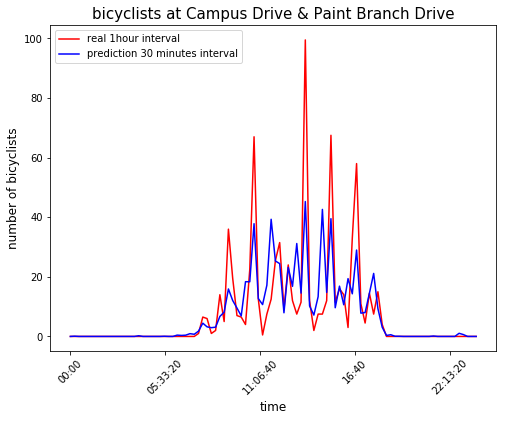

R2=0.8832349745608099


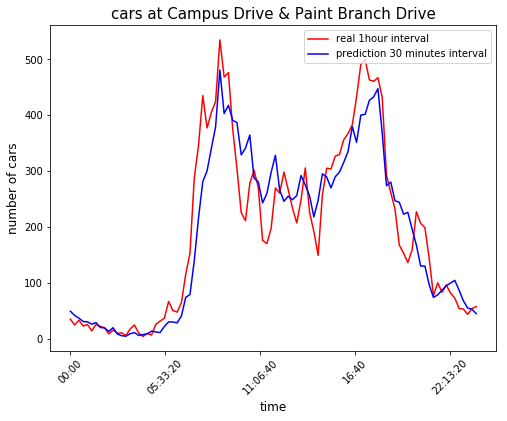

R2=0.8842812591310371


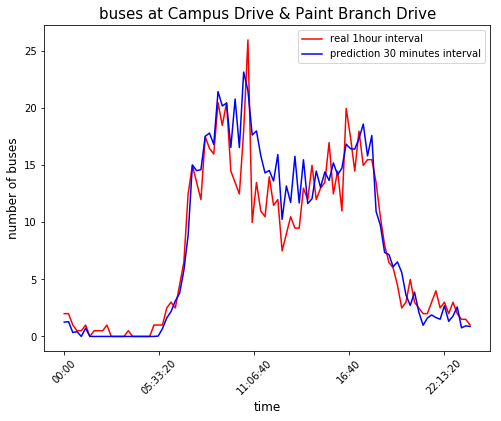

R2=0.8378316516807982


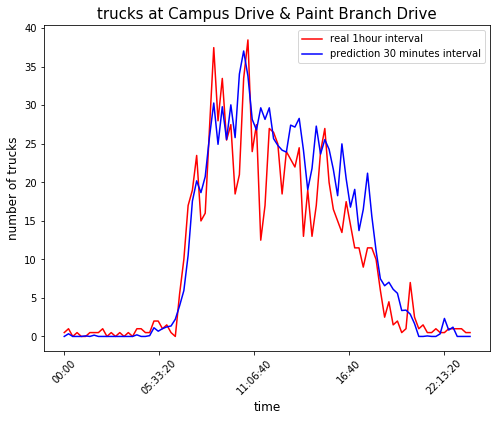

In [272]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor

#Data Preprocessing
Dots_test=Dots_mod[Dots_mod['Date']=='2019-10-29'].copy()
Dots_mod['FB_start']=Dots_mod['Date'].apply(lambda x: 12 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['FB_end']=Dots_mod['Date'].apply(lambda x: 15 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['hour']=Dots_mod['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_mod['temp']=Dots_mod['Date'].apply(lambda x: temperature(x))
Dots_mod['is_weekend']=Dots_mod['weekday'].apply(lambda x: 1 if x==6 or x==7 else -1)
Dots_mod['is_gameday']=Dots_mod['Date'].apply(lambda x: 1 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['to_FB_start']=Dots_mod[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_FB_end']=Dots_mod[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_class_peak']=Dots_mod[['hour','weekday']].apply(to_class_peaks,axis=1)
Dots_mod['num_peaks']=Dots_mod['weekday'].apply(calculated_peak_number)

## You can revise game time here
Dots_test['Date']='2019-10-22'
Dots_test['FB_start']=-1
Dots_test['FB_end']=-1
Dots_test['hour']=Dots_test['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_test['temp']=58
Dots_test['is_weekend']=-1
Dots_test['is_gameday']=-1
Dots_test['to_FB_start']=Dots_test[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_test['to_FB_end']=Dots_test[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_test['to_class_peak']=Dots_test[['hour','weekday']].apply(to_class_peaks_2,axis=1)
Dots_test['num_peaks']=Dots_test['weekday'].apply(calculated_peak_number_2)

Dots_input=Dots_mod.append(Dots_test,ignore_index=True)



locs=['Stadium Drive & Regents Drive','Campus_Dr_&_Presidential_Ave','University_Blvd_&_Paint_Branch_Dr',
                 'Baltimore Avenue & Regents Drive (South Gate)','Campus Drive & Paint Branch Drive']
types=['pedestrians','bicyclists','cars','buses','trucks']

Dots_list, train_idx_list,test_idx_list=generate_train_test_idx_based_date(Dots_input,locs,types,'2019-10-22')

#analysis about the time
for i in range(len(locs)):
    df=Dots_list[i]
    idx=range(df.shape[0])
    test_idx=test_idx_list[i]
    #test_idx=idx
    train_idx=train_idx_list[i]
    
    test_1=df.iloc[test_idx,:]
    test_1=test_1[test_1["is_gameday"]==-1]
    if test_1.shape[0]!=0:
        test_y_1_int=model_1_for_no_gamedays(df,train_idx,test_idx)
        test_y_1=pd.DataFrame(data=test_y_1_int, columns=['pedestrians','bicyclists','cars','buses','trucks'])
        test_y_1['time']=test_1.time.values
    
    test_2=df.iloc[test_idx,:]
    test_2=test_2[test_2["is_gameday"]==1]
    if test_2.shape[0]!=0:
        test_y_2_in=model_2_for_gameday(df,train_idx,test_idx)
        test_y_2=pd.DataFrame(data=test_y_2_in, columns=['pedestrians','bicyclists','cars','buses','trucks'])
        test_y_2['time']=test_2.time.values
    
    if test_2.shape[0]==0:
        test_y=test_y_1
    elif test_1.shape[0]==0:
        test_y=test_y_2
    else:
        test_y=test_y_1.append(test_y_2)
        
    test_y=test_y.sort_values(by='time',ascending=True)
    
    
    
    true_y=df.iloc[test_idx,:][['pedestrians','bicyclists','cars','buses','trucks']]
    x=df.iloc[test_idx,:].StartTime
    
    
    
    
    for j in range(len(types)):
        acc=r2_score(true_y[types[j]], test_y.iloc[:,j])
        print ("R2="+ str(acc))
        fig = plt.figure(figsize=(8,6))
        ax = plt.subplot(111)
        ax.plot(x, true_y[types[j]], label='real 1hour interval',color='r')
        ax.plot(x, test_y.iloc[:,j], label='prediction 30 minutes interval',color='b')
        ax.legend()
        plt.xlabel('time', fontsize =12)
        plt.xticks(rotation=45)
        plt.ylabel('number of '+ types[j],fontsize =12)
        plt.title(types[j] + ' at '+locs[i], color = "k",fontsize =15)
        plt.show()
    

## Experiment 3: Population


D:\Users\mrzcl\Anaconda3\envs\homework1\lib\site-packages\ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
D:\Users\mrzcl\Anaconda3\envs\homework1\lib\site-packages\ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


R2=0.8319420246082642


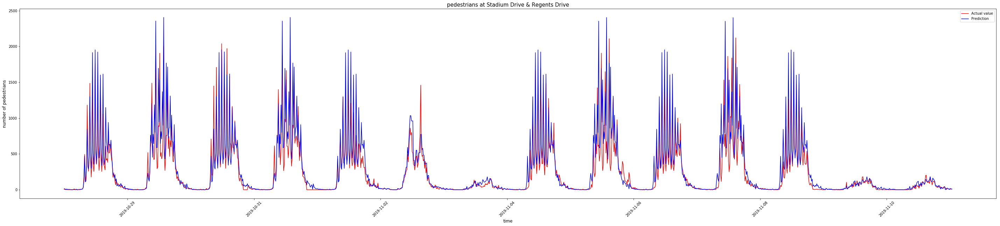

R2=0.8185017567931462


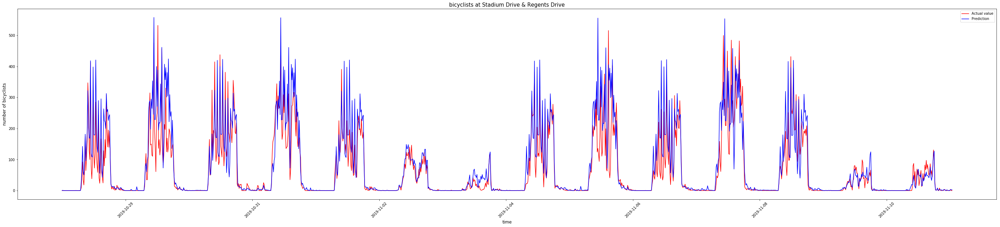

R2=0.8916910976062712


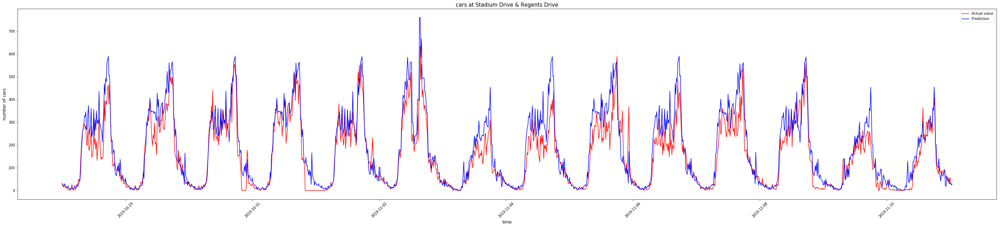

R2=0.8780610534493928


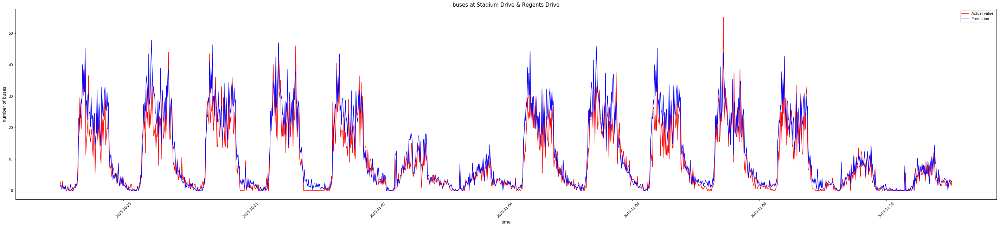

R2=0.8744701875216923


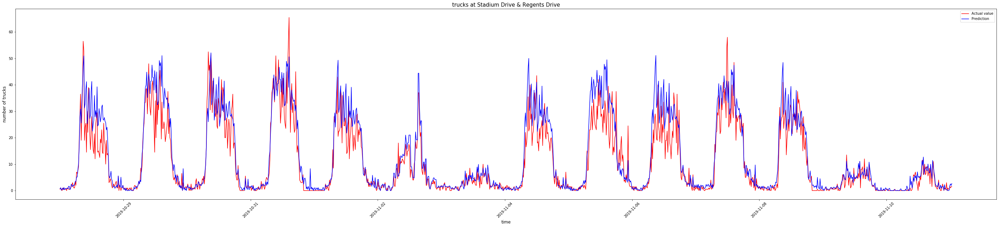

R2=0.7242500529369564


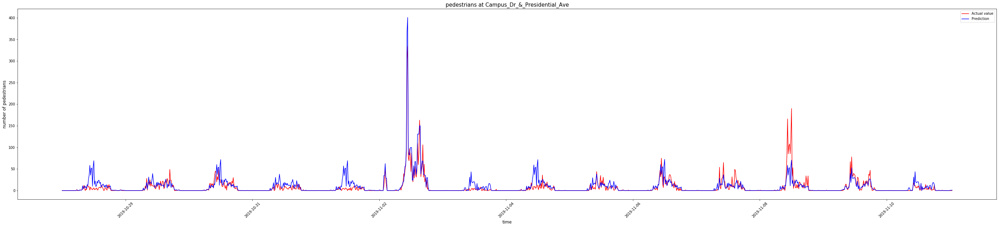

R2=0.529144453133934


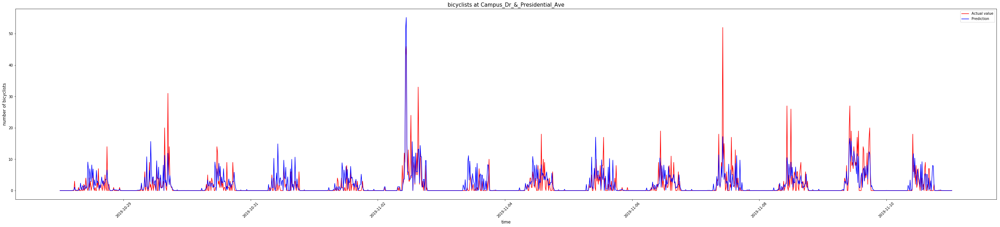

R2=0.8531691889301658


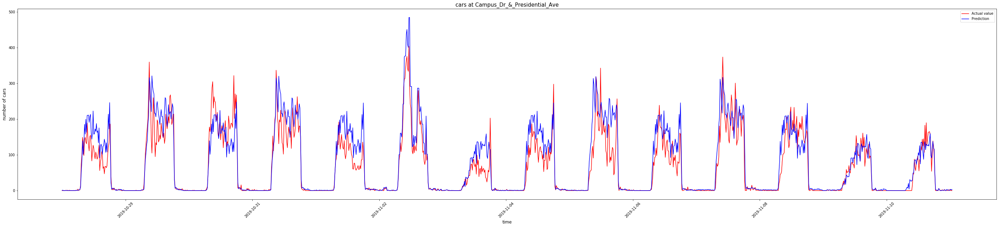

R2=0.727531380419276


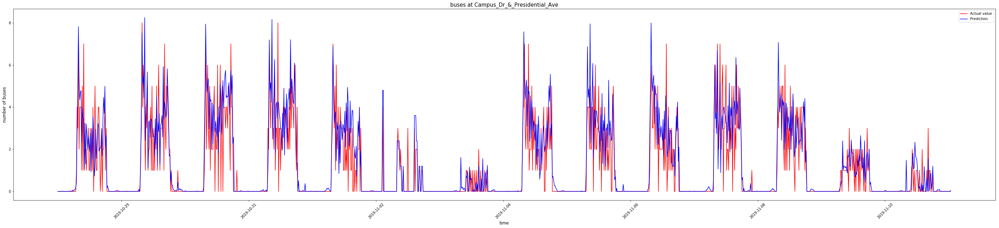

R2=0.6559366372209828


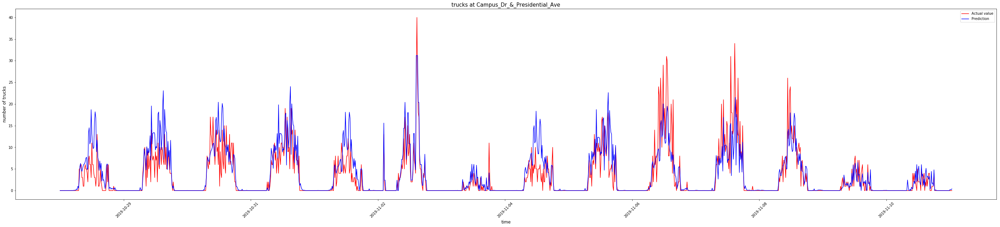

R2=0.5698583623163658


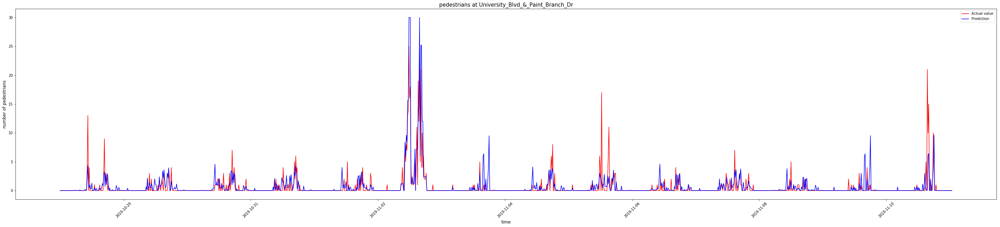

R2=0.2424722136623516


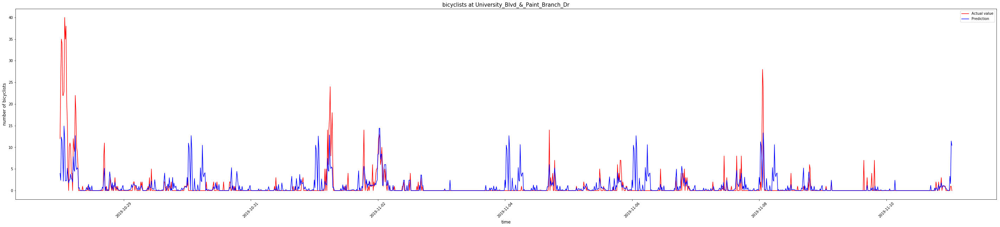

R2=0.8935872847545394


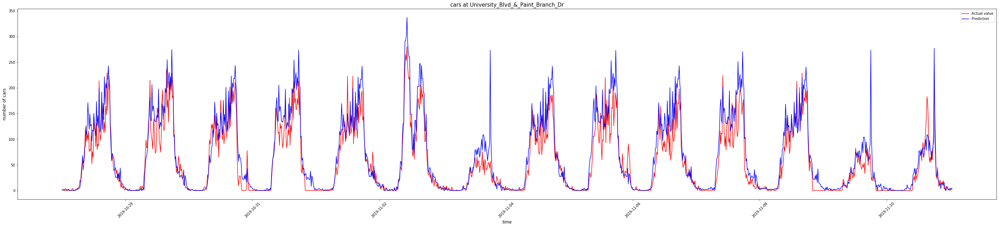

R2=0.4754481364249802


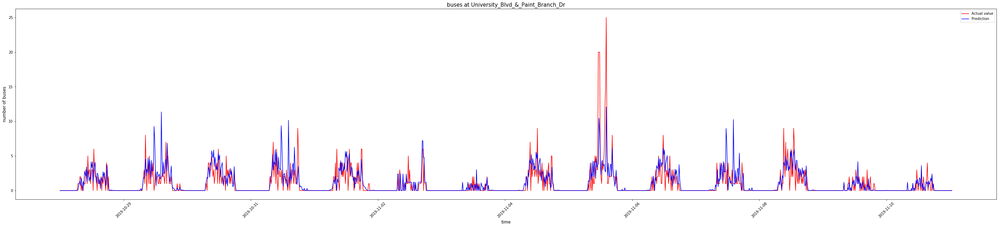

R2=0.7872148215570178


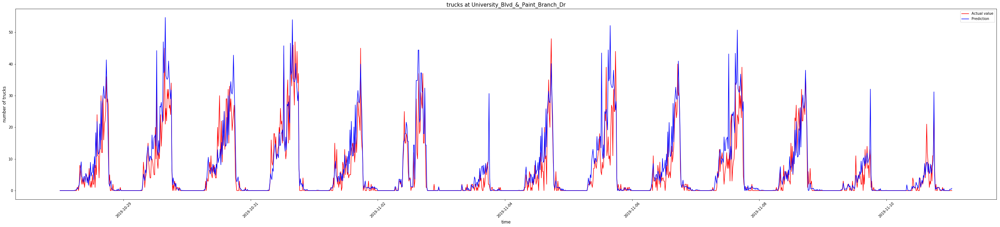

R2=0.8244362717909718


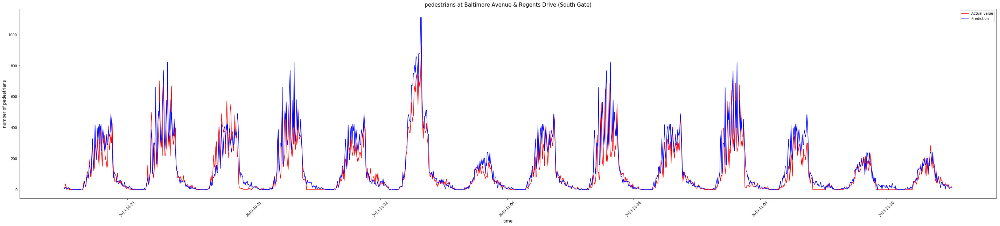

R2=0.7480877988125615


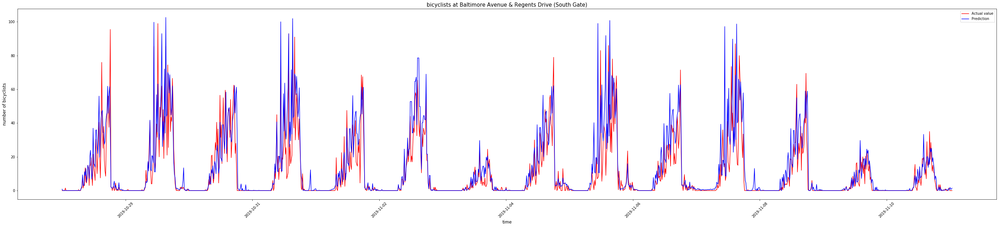

R2=0.9056392611032713


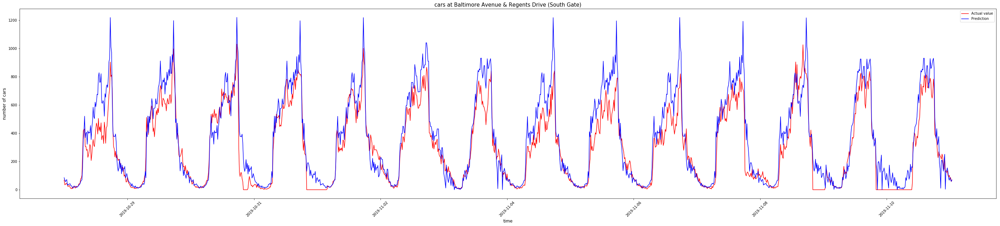

R2=0.7501613324197703


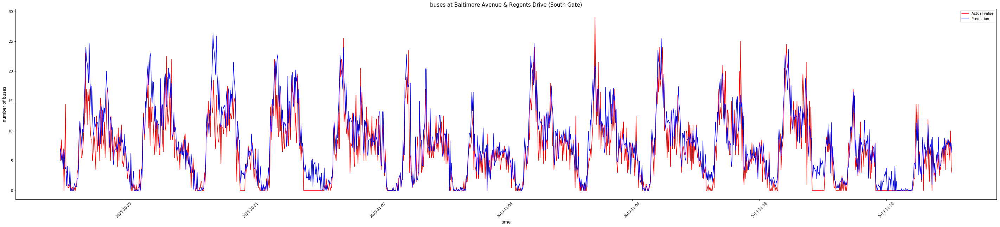

R2=0.773140452012387


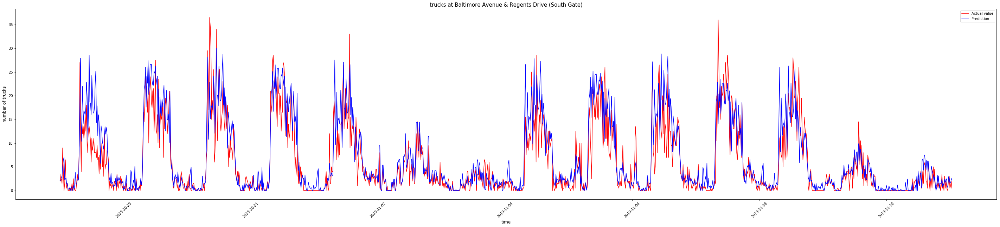

R2=0.6931583701683723


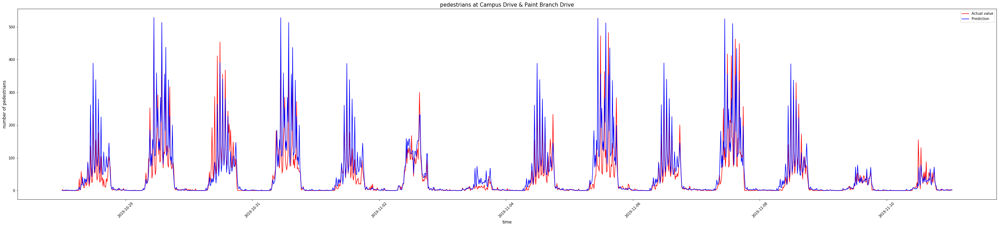

R2=0.598029302651784


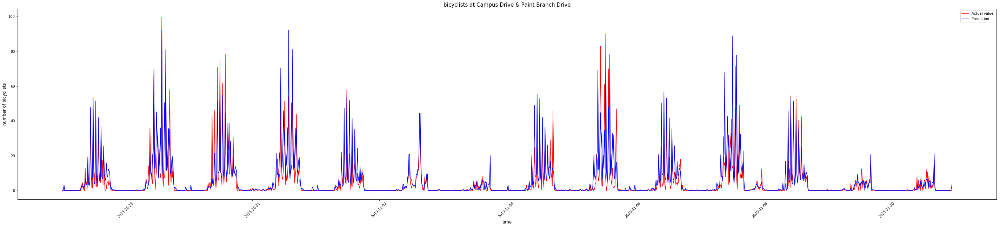

R2=0.829201268400938


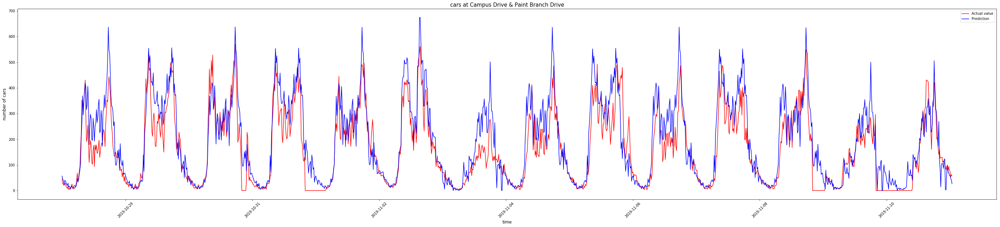

R2=0.8867604072673938


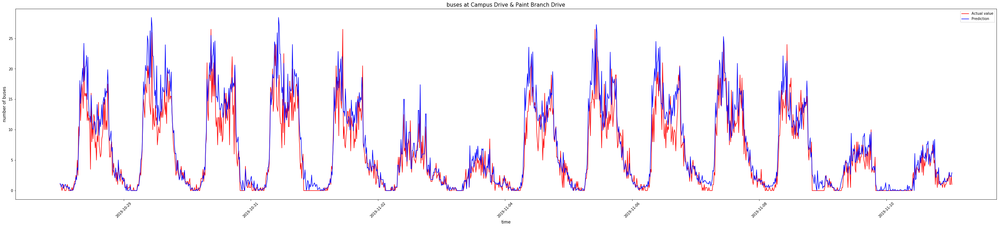

R2=0.8454196950590213


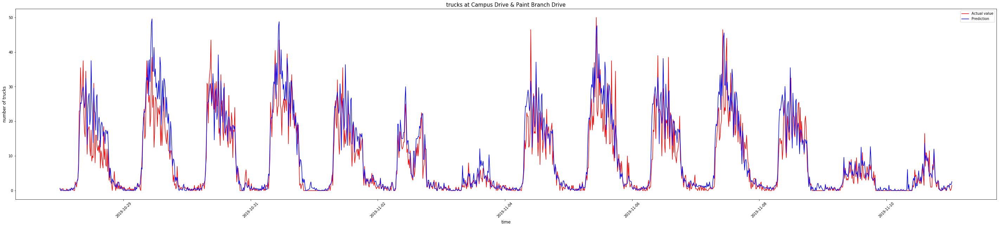

In [273]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor

#Data Preprocessing
Dots_mod['FB_start']=Dots_mod['Date'].apply(lambda x: 12 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['FB_end']=Dots_mod['Date'].apply(lambda x: 15 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['hour']=Dots_mod['StartTime'].apply(lambda x: (int(x.hour)+float(x.minute/60)))
Dots_mod['temp']=Dots_mod['Date'].apply(lambda x: temperature(x))
Dots_mod['is_weekend']=Dots_mod['weekday'].apply(lambda x: 1 if x==6 or x==7 else -1)
Dots_mod['is_gameday']=Dots_mod['Date'].apply(lambda x: 1 if x.date()==datetime.date(2019,11,2) else -1)
Dots_mod['to_FB_start']=Dots_mod[['hour','FB_start']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_FB_end']=Dots_mod[['hour','FB_end']].apply(lambda x: x[0]-x[1],axis=1)
Dots_mod['to_class_peak']=Dots_mod[['hour','weekday']].apply(to_class_peaks,axis=1)
Dots_mod['num_peaks']=Dots_mod['weekday'].apply(calculated_peak_number)

#Dots_mod['BK_start']=Dots_mod['Date'].apply(lambda x: 19.5 if x.date()==datetime.date(2019,11,1) or x.date()==datetime.date(2019,11,5) else (21 if x.date()==datetime.date(2019,11,9) else -1))
#Dots_mod['BK_end']=Dots_mod['Date'].apply(lambda x: 22.5 if x.date()==datetime.date(2019,11,1) or x.date()==datetime.date(2019,11,5) else (24 if x.date()==datetime.date(2019,11,9) else -1))

Dots_input=Dots_mod.copy()

locs=['Stadium Drive & Regents Drive','Campus_Dr_&_Presidential_Ave','University_Blvd_&_Paint_Branch_Dr',
                 'Baltimore Avenue & Regents Drive (South Gate)','Campus Drive & Paint Branch Drive']
types=['pedestrians','bicyclists','cars','buses','trucks']
ratio=0.30
Dots_list,train_idx_list,test_idx_list=generate_train_test_idx(Dots_input,locs,types,ratio)

#Type in your population ratio
population_ratio=1.2


#analysis about the time


for i in range(len(locs)):
    df=Dots_list[i]
    idx=range(df.shape[0])
    #test_idx=test_idx_list[i]
    test_idx=idx
    train_idx=train_idx_list[i]
    
    test_y_1_int=model_1_for_no_gamedays(df,train_idx,test_idx)
    test_y_1=pd.DataFrame(data=test_y_1_int, columns=['pedestrians','bicyclists','cars','buses','trucks'])
    test_1=df.iloc[test_idx,:]
    test_1=test_1[test_1["is_gameday"]==-1]
    test_y_1['time']=test_1.time.values
    
    
    test_y_2_in=model_2_for_gameday(df,train_idx,test_idx)
    test_2=df.iloc[test_idx,:]
    test_2=test_2[test_2["is_gameday"]==1]
    test_y_2=pd.DataFrame(data=test_y_2_in, columns=['pedestrians','bicyclists','cars','buses','trucks'])
    test_y_2['time']=test_2.time.values
    
    test_y=test_y_1.append(test_y_2)
    test_y=test_y.sort_values(by='time',ascending=True)
    
    
    
    true_y=df.iloc[test_idx,:][['pedestrians','bicyclists','cars','buses','trucks']]
    x=df.iloc[test_idx,:].time
    
    
    
    
    for j in range(len(types)):
        acc=r2_score(true_y[types[j]], test_y.iloc[:,j])
        print ("R2="+ str(acc))
        fig = plt.figure(figsize=(50,10))
        ax = plt.subplot(111)
        ax.plot(x, true_y[types[j]], label='Actual value',color='r')
        ax.plot(x, test_y.iloc[:,j]*population_ratio, label='Prediction',color='b')
        ax.legend()
        plt.xlabel('time', fontsize =12)
        plt.xticks(rotation=45)
        plt.ylabel('number of '+ types[j],fontsize =12)
        plt.title(types[j] + ' at '+locs[i], color = "k",fontsize =15)
        plt.show()
    
    


